# Generating Audio

This notebook is a supplementary material for the Generating Audio Chapter of the [Hands-On Generative AI with Transformers and Diffusion Models book](https://learning.oreilly.com/library/view/hands-on-generative-ai/9781098149239/). This notebook includes:

* The code from the book
* Additional examples
* Exercise solutions

In [2]:
import diffusers
import transformers

transformers.logging.set_verbosity_error()
diffusers.logging.set_verbosity_error()

## Audio Data


In [3]:
from datasets import load_dataset_builder

ds_builder = load_dataset_builder(
    "openslr/librispeech_asr", trust_remote_code=True
)
ds_builder.info.splits

{'train.clean.100': SplitInfo(name='train.clean.100', num_bytes=6627791685, num_examples=28539, shard_lengths=None, dataset_name=None),
 'train.clean.360': SplitInfo(name='train.clean.360', num_bytes=23927767570, num_examples=104014, shard_lengths=None, dataset_name=None),
 'train.other.500': SplitInfo(name='train.other.500', num_bytes=31852502880, num_examples=148688, shard_lengths=None, dataset_name=None),
 'validation.clean': SplitInfo(name='validation.clean', num_bytes=359505691, num_examples=2703, shard_lengths=None, dataset_name=None),
 'validation.other': SplitInfo(name='validation.other', num_bytes=337213112, num_examples=2864, shard_lengths=None, dataset_name=None),
 'test.clean': SplitInfo(name='test.clean', num_bytes=368449831, num_examples=2620, shard_lengths=None, dataset_name=None),
 'test.other': SplitInfo(name='test.other', num_bytes=353231518, num_examples=2939, shard_lengths=None, dataset_name=None)}

In [4]:
ds_builder.info.features

{'file': Value(dtype='string', id=None),
 'audio': Audio(sampling_rate=16000, mono=True, decode=True, id=None),
 'text': Value(dtype='string', id=None),
 'speaker_id': Value(dtype='int64', id=None),
 'chapter_id': Value(dtype='int64', id=None),
 'id': Value(dtype='string', id=None)}

In [5]:
from datasets import load_dataset

ds = load_dataset(
    "openslr/librispeech_asr",
    split="train.clean.360",
    streaming=True,
)
sample = next(iter(ds))
sample

{'file': '1487-133273-0000.flac',
 'audio': {'path': '1487-133273-0000.flac',
  'array': array([ 9.15527344e-05,  4.57763672e-04,  5.18798828e-04, ...,
         -4.57763672e-04, -5.49316406e-04, -4.88281250e-04]),
  'sampling_rate': 16000},
 'text': 'THE SECOND IN IMPORTANCE IS AS FOLLOWS SOVEREIGNTY MAY BE DEFINED TO BE THE RIGHT OF MAKING LAWS IN FRANCE THE KING REALLY EXERCISES A PORTION OF THE SOVEREIGN POWER SINCE THE LAWS HAVE NO WEIGHT',
 'speaker_id': 1487,
 'chapter_id': 133273,
 'id': '1487-133273-0000'}

In [6]:
array = sample["audio"]["array"]
sampling_rate = sample["audio"]["sampling_rate"]

# Let's get the first 5 seconds
array = array[: sampling_rate * 5]
print(f"Number of samples: {len(array)}. Values: {array}")

Number of samples: 80000. Values: [9.15527344e-05 4.57763672e-04 5.18798828e-04 ... 7.05261230e-02
 5.92041016e-02 6.50329590e-02]


In Jupyter notebooks, you can use `IPython` to play audio files.

In [7]:
import IPython.display as ipd

ipd.Audio(data=array, rate=sampling_rate)

### Waveforms

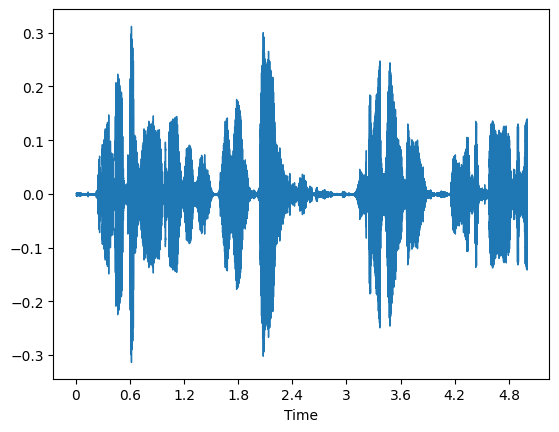

In [8]:
import librosa.display

librosa.display.waveshow(array, sr=sampling_rate);

### Spectrogram and Mel Spectrogram

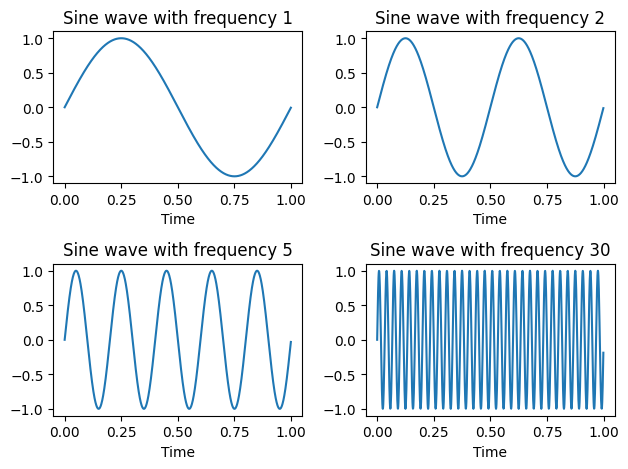

In [9]:
import numpy as np
from matplotlib import pyplot as plt


def plot_sine(freq):
    sr = 1000  # samples per second
    ts = 1.0 / sr  # sampling interval
    t = np.arange(0, 1, ts)  # time vector
    amplitude = np.sin(2 * np.pi * freq * t)

    plt.plot(t, amplitude)
    plt.title("Sine wave with frequency {}".format(freq))
    plt.xlabel("Time")


fig = plt.figure()

plt.subplot(2, 2, 1)
plot_sine(1)

plt.subplot(2, 2, 2)
plot_sine(2)

plt.subplot(2, 2, 3)
plot_sine(5)

plt.subplot(2, 2, 4)
plot_sine(30)

fig.tight_layout()
plt.show()

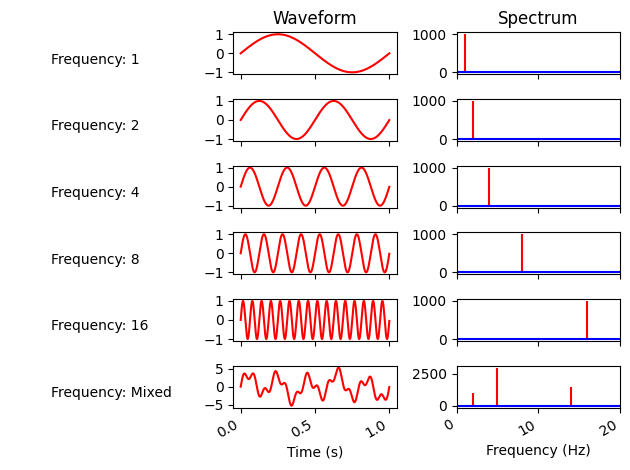

In [10]:
import numpy as np

fig, axes = plt.subplots(nrows=6, ncols=3)
freqs = [1, 2, 4, 8, 16, 32]
sampling_rate_f = 2000
sampling_interval = 1 / sampling_rate_f

for i in range(6):
    freq = freqs[i]
    text_freq = freq
    samples = np.arange(0, 1, sampling_interval)

    # Build function
    if i == 5:
        data = np.sin(2 * np.pi * 2 * samples)
        data += 3 * np.sin(2 * np.pi * 5 * samples)
        data += 1.5 * np.sin(2 * np.pi * 14 * samples)
        text_freq = "Mixed"
    else:
        data = np.sin(2 * np.pi * freq * samples)

    ax_text = axes[freqs.index(freq), 0]
    ax_waveform = axes[freqs.index(freq), 1]
    ax_spectrum = axes[freqs.index(freq), 2]

    # Add text column
    ax_text.set_axis_off()
    ax_text.text(0.25, 0.25, f"""Frequency: {text_freq}""")

    # Plot waveform
    ax_waveform.plot(samples, data, "r")

    # Plot spectrum
    ax_spectrum.set_xlim((0, 20))
    X = np.fft.fft(data)
    N = len(X)
    n = np.arange(N)
    T = N / sampling_rate_f
    freq = n / T
    ax_spectrum.stem(freq, np.abs(X), "r", markerfmt=" ", basefmt="-b")

axes[5, 1].set_xlabel("Time (s)")
axes[5, 2].set_xlabel("Frequency (Hz)")
for ax, col in zip(axes[0], ["", "Waveform", "Spectrum"]):
    ax.set_title(col)

fig.autofmt_xdate()
fig.tight_layout()
plt.show()

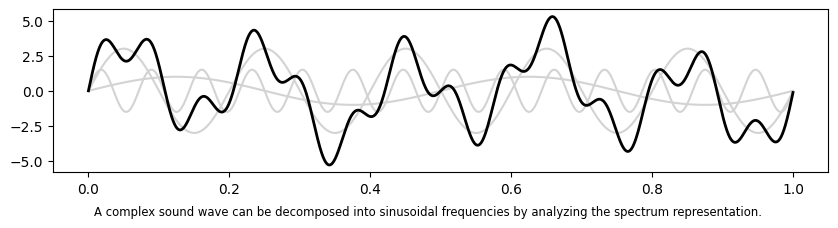

In [11]:
wave_1 = np.sin(2 * np.pi * 2 * samples)
wave_2 = 3 * np.sin(2 * np.pi * 5 * samples)
wave_3 = 1.5 * np.sin(2 * np.pi * 14 * samples)
combined = wave_1 + wave_2 + wave_3

fig = plt.figure(figsize=(10, 2.4))
fig.autofmt_xdate()
fig.tight_layout()

fig.supxlabel(
    "A complex sound wave can be decomposed into sinusoidal frequencies by analyzing the spectrum representation.",
    fontsize="small",
)

plt.plot(samples, wave_1, label="Wave 1", c="lightgray")
plt.plot(samples, wave_2, label="Wave 2", c="lightgray")
plt.plot(samples, wave_3, label="Wave 3", c="lightgray")
plt.plot(samples, combined, label="Combined", c="black", linewidth=2)

# plt.xticks([])
# plt.yticks([])

plt.show()

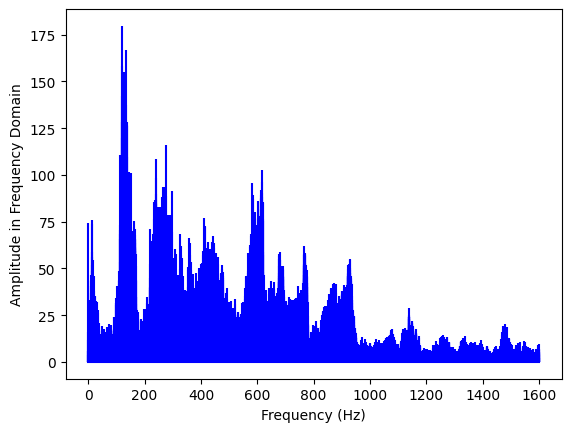

In [12]:
# Compute the Fast Fourier Transform (FFT) of the input signal
X = np.fft.fft(array)

# Length of the FFT result (which is the same as the length of the input signal)
N = len(X)

# Calculate the frequency bins corresponding to the FFT result
n = np.arange(N)
T = N / sampling_rate
freq = n / T

# Plot the amplitude spectrum for the first 8000 frequency bins
# We could plot all the bins, but we would get a mirror image of the spectrum
plt.stem(freq[:8000], np.abs(X[:8000]), "b", markerfmt=" ", basefmt="-b")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude in Frequency Domain")
plt.show()

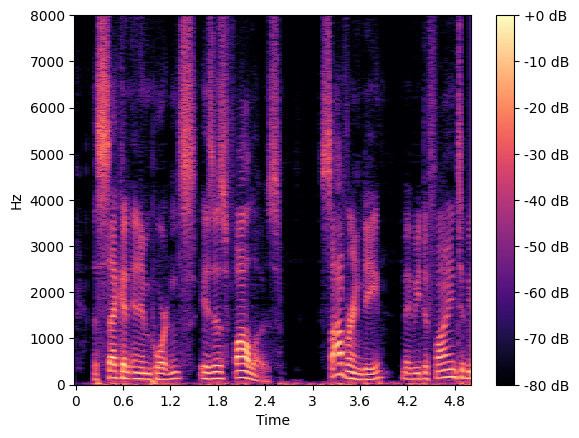

In [13]:
# Compute Short-Time Fourier Transform (STFT)
# We take the absolute value of the STFT to get the amplitude
# of each frequency bin.
D = np.abs(librosa.stft(array))

# Convert the ampltiude into decibels
# which is logarithmic.
S_db = librosa.amplitude_to_db(D, ref=np.max)

# Generate the spectrogram display
librosa.display.specshow(S_db, sr=sampling_rate, x_axis="time", y_axis="hz")
plt.colorbar(format="%+2.0f dB");

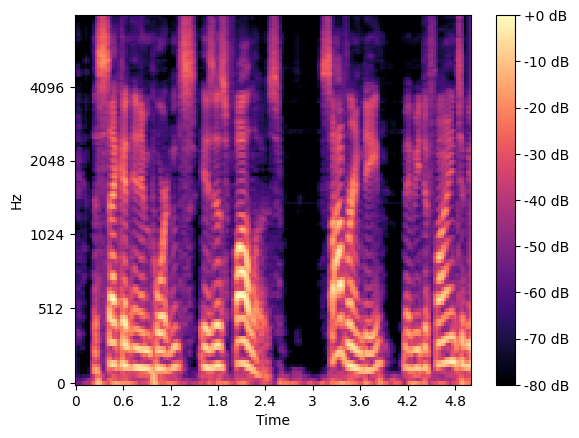

In [14]:
# Generate a Mel-scaled spectrogram from the audio signal.
# The result is a matrix where each element corresponds to the power
# of a frequency band (in the Mel scale) at a specific time.
S = librosa.feature.melspectrogram(y=array, sr=sampling_rate)

# We convert the power spectrogram to a decibel scale
S_dB = librosa.power_to_db(S, ref=np.max)

# Display the Mel-scaled spectrogram
librosa.display.specshow(S_dB, sr=sampling_rate, x_axis="time", y_axis="mel")
plt.colorbar(format="%+2.0f dB");

## Speech to Text with Transformers-Based Architectures

In [ ]:
from transformers import pipeline

pipe = pipeline(
    "automatic-speech-recognition",
    model="openai/whisper-tiny",
    max_new_tokens=100,
)
pipe(array)

generation_config.json:   0%|          | 0.00/3.75k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/283k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/836k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.48M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/494k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/34.6k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/2.19k [00:00<?, ?B/s]

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


{'text': ' Chapter 16 I might have told you of the beginning'}

### Encoder-Based Techniques


In [15]:
import torch
from transformers import Wav2Vec2ForCTC, Wav2Vec2Processor

from genaibook.core import get_device

device = get_device()

# The AutoProcessor has the pre and post-processing incorporated
wav2vec2_processor = Wav2Vec2Processor.from_pretrained(
    "facebook/wav2vec2-base-960h"
)
wav2vec2_model = Wav2Vec2ForCTC.from_pretrained(
    "facebook/wav2vec2-base-960h"
).to(device)

# Run forward pass, making sure to resample to 16kHz
inputs = wav2vec2_processor(
    array, sampling_rate=sampling_rate, return_tensors="pt"
)
with torch.inference_mode():
    outputs = wav2vec2_model(**inputs.to(device))

# Transcribe
predicted_ids = torch.argmax(outputs.logits, dim=-1)
transcription = wav2vec2_processor.batch_decode(predicted_ids)
print(transcription)

['THE SECOND IN IMPORTANCE IS AS FOLLOWS SOVEREIGNTY MAY BE DEFINED TO']


### Encoder-Decoder Techniques


In [ ]:
from transformers import WhisperTokenizer

tokenizer = WhisperTokenizer.from_pretrained(
    "openai/whisper-small", language="Spanish", task="transcribe"
)

input_str = "Hola, ¿cómo estás?"
labels = tokenizer(input_str).input_ids
decoded_with_special = tokenizer.decode(
    labels, skip_special_tokens=False
)
decoded_str = tokenizer.decode(labels, skip_special_tokens=True)  # <4>

print(f"Input:                         {input_str}")
print(f"Formatted input w/ special:    {decoded_with_special}")
print(f"Formatted input w/out special: {decoded_str}")

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Input:                         Hola, ¿cómo estás?
Formatted input w/ special:    <|startoftranscript|><|es|><|transcribe|><|notimestamps|>Hola, ¿cómo estás?<|endoftext|>
Formatted input w/out special: Hola, ¿cómo estás?


In [ ]:
from transformers import WhisperForConditionalGeneration, WhisperProcessor

whisper_processor = WhisperProcessor.from_pretrained("openai/whisper-small")
whisper_model = WhisperForConditionalGeneration.from_pretrained(
    "openai/whisper-small"
).to(device)

inputs = whisper_processor(
    array, sampling_rate=sampling_rate, return_tensors="pt"
)
with torch.inference_mode():
    generated_ids = whisper_model.generate(**inputs.to(device))

transcription = whisper_processor.batch_decode(
    generated_ids, skip_special_tokens=False
)[0]
print(transcription)

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


<|startoftranscript|><|en|><|transcribe|><|notimestamps|> Chapter 16. I might have told you of the beginning<|endoftext|>


### From Model to Pipeline


In [ ]:
from genaibook.core import generate_long_audio

long_audio = generate_long_audio()

In [ ]:
display(ipd.Audio(long_audio, rate=16000))

In [ ]:
device = get_device()

pipe = pipeline(
    "automatic-speech-recognition", model="openai/whisper-small", device=device
)
pipe(
    long_audio,
    generate_kwargs={"task": "transcribe"},
    chunk_length_s=5,
    batch_size=8,
    return_timestamps=True,
)

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


{'text': " Chapter 16. I might have told you of the beginning of this liaison in a few lines, but I wanted you to see every step by which we came. I too agree to whatever Marguerite wished, margarite to be unable to live apart from me. It was the day after the evening when she came to see me that I sent her Manon the Scott. From that time, seeing that I could not change my mistress's life. I changed my own. I wished above all not to leave myself time to think over the position I had accepted, for, in spite of myself, it was a great distress to me. Thus my life, generally so calm, assumed all at once an appearance of noise and disorder. Never believe, however disinterested, the love of a kept woman may be, that it will cost one nothing. Nothing is so expensive as their caprices, flowers, boxes at the theater, suppers, days in the country, which one can never refuse to one's mistress. As I have told you, I had little money.",
 'chunks': [{'timestamp': (0.0, 25.13),
   'text': ' Chapter 1

### Evaluation

In [ ]:
from genaibook.core import measure_latency_and_memory_use

wav2vec2_pipe = pipeline(
    "automatic-speech-recognition",
    model="facebook/wav2vec2-base-960h",
    device=device,
)
whisper_pipe = pipeline(
    "automatic-speech-recognition", model="openai/whisper-base", device=device
)

with torch.inference_mode():
    measure_latency_and_memory_use(
        wav2vec2_pipe, array, "Wav2Vec2", device, nb_loops=100
    )
    measure_latency_and_memory_use(
        whisper_pipe, array, "Whisper", device=device, nb_loops=100
    )

Some weights of the model checkpoint at facebook/wav2vec2-base-960h were not used when initializing Wav2Vec2ForCTC: ['wav2vec2.encoder.pos_conv_embed.conv.weight_g', 'wav2vec2.encoder.pos_conv_embed.conv.weight_v']
- This IS expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base-960h and are newly initialized: ['wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'wav2vec2.masked_spec_embed']
You sho

Ignored unknown kwarg option normalize
Ignored unknown kwarg option normalize
Ignored unknown kwarg option normalize
Ignored unknown kwarg option normalize


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
/home/osanseviero/miniconda3/envs/book/lib/python3.10/site-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(


Wav2Vec2 execution time: 0.009052367553710937 seconds
Wav2Vec2 max memory footprint: 2.40356608 GB
Whisper execution time: 0.112448466796875 seconds
Whisper max memory footprint: 2.4815779840000003 GB


In [ ]:
from evaluate import load

wer_metric = load("wer")

label = "how can the llama jump"
pred = "can the lama jump up"
wer = wer_metric.compute(references=[label], predictions=[pred])

print(wer)

0.6


In [ ]:
from transformers.models.whisper.english_normalizer import BasicTextNormalizer

normalizer = BasicTextNormalizer()
print(normalizer("I'm having a great day!"))

In [ ]:
# This code example is optimized for explainability
# The inference could be done in batches for speedup, for example.
from datasets import Audio

def normalize(batch):
    batch["norm_text"] = normalizer(batch["sentence"])
    return batch

def prepare_dataset(language="en", sample_count=200):
    dataset = load_dataset(
        "mozilla-foundation/common_voice_13_0",
        language,
        split="test",
        streaming=True,
    )
    dataset = dataset.cast_column("audio", Audio(sampling_rate=16000)) 
    dataset = dataset.take(sample_count)
    buffered_dataset = [sample for sample in dataset.map(normalize)]
    return buffered_dataset

def evaluate_model(pipe, dataset, lang="en", use_whisper=False):
    predictions, references = [], []

    for sample in dataset:
        if use_whisper:
            extra_kwargs = {
                "task": "transcribe",
                "language": f"<|{lang}|>",
                "max_new_tokens": 100,
            }
            transcription = pipe(
                sample["audio"]["array"],
                return_timestamps=True,
                generate_kwargs=extra_kwargs,
            )
        else:
            transcription = pipe(sample["audio"]["array"])
        predictions.append(normalizer(transcription["text"]))
        references.append(sample["norm_text"])
    return predictions, references

In [ ]:
eval_suite = [
    ["Wav2Vec2", wav2vec2_pipe, "en"],
    ["Wav2Vec2", wav2vec2_pipe, "fr"],
    ["Whisper", whisper_pipe, "en"],
    ["Whisper", whisper_pipe, "fr"],
]

In [ ]:
cer_metric = load("cer")

# Pre-process the English and French datasets
processed_datasets = {
    "en": prepare_dataset("en"),
    "fr": prepare_dataset("fr"),
}

for config in eval_suite:
    model_name, pipeline, lang = config[0], config[1], config[2]

    dataset = processed_datasets[lang]

    predictions, references = evaluate_model(
        pipeline, dataset, lang, model_name == "Whisper"
    )

    # Compute evaluation metrics
    wer = wer_metric.compute(references=references, predictions=predictions)
    cer = cer_metric.compute(references=references, predictions=predictions)

    print(f"{model_name} metrics for lang: {lang}. WER: {wer}, CER: {cer}")

Reading metadata...: 16372it [00:01, 10231.31it/s]


Wav2Vec2 metrics for lang: en. WER: 0.44012772751463547 , CER: 0.22138524750538055


Reading metadata...: 16114it [00:01, 9615.79it/s]


Wav2Vec2 metrics for lang: fr. WER: 1.0099113197704748 , CER: 0.5745033112582781


Reading metadata...: 16372it [00:01, 14957.54it/s]


Whisper metrics for lang: en. WER: 0.2687599787120809 , CER: 0.14674232048522795


Reading metadata...: 16114it [00:01, 15755.33it/s]
Whisper did not predict an ending timestamp, which can happen if audio is cut off in the middle of a word. Also make sure WhisperTimeStampLogitsProcessor was used during generation.
Whisper did not predict an ending timestamp, which can happen if audio is cut off in the middle of a word. Also make sure WhisperTimeStampLogitsProcessor was used during generation.


Whisper metrics for lang: fr. WER: 0.548774126238915 , CER: 0.27676600441501104


## From Text to Speech to Generative Audio


### Generating Audio with Sequence-to-Sequence Models


In [47]:
from transformers import SpeechT5ForSpeechToText, SpeechT5Processor

processor = SpeechT5Processor.from_pretrained("microsoft/speecht5_asr")
model = SpeechT5ForSpeechToText.from_pretrained("microsoft/speecht5_asr")

inputs = processor(
    audio=array, sampling_rate=sampling_rate, return_tensors="pt"
)
with torch.inference_mode():
    predicted_ids = model.generate(**inputs, max_new_tokens=70)

transcription = processor.batch_decode(predicted_ids, skip_special_tokens=True)
print(transcription)

Some weights of the model checkpoint at microsoft/speecht5_asr were not used when initializing SpeechT5ForSpeechToText: ['speecht5.encoder.prenet.pos_conv_embed.conv.weight_v', 'speecht5.encoder.prenet.pos_conv_embed.conv.weight_g']
- This IS expected if you are initializing SpeechT5ForSpeechToText from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing SpeechT5ForSpeechToText from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of SpeechT5ForSpeechToText were not initialized from the model checkpoint at microsoft/speecht5_asr and are newly initialized: ['speecht5.encoder.prenet.pos_sinusoidal_embed.weights', 'speecht5.encoder.prenet.pos_conv_embed.conv.parametrizations.weight.original1', 'speecht

['chapter sixteen i might have told you of the beginning i might have told you of the beginning of the beginning of the beginning of the beginning of the beginning chapter sixteen']


In [48]:
from transformers import SpeechT5ForTextToSpeech

from genaibook.core import get_speaker_embeddings

processor = SpeechT5Processor.from_pretrained("microsoft/speecht5_tts")
model = SpeechT5ForTextToSpeech.from_pretrained("microsoft/speecht5_tts")

inputs = processor(text="There are llamas all around.", return_tensors="pt")
speaker_embeddings = torch.tensor(get_speaker_embeddings()).unsqueeze(0)

with torch.inference_mode():
    spectrogram = model.generate_speech(inputs["input_ids"], speaker_embeddings)
     

Generating validation split:   0%|          | 0/7931 [00:00<?, ? examples/s]

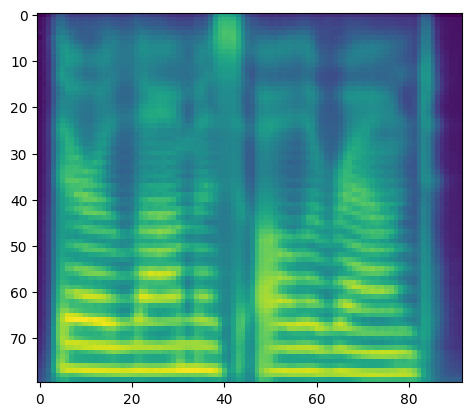

In [49]:
plt.figure()
plt.imshow(np.rot90(np.array(spectrogram)))
plt.show()

In [50]:
from transformers import SpeechT5HifiGan

vocoder = SpeechT5HifiGan.from_pretrained("microsoft/speecht5_hifigan")
with torch.inference_mode():
    # Alternatively
    # model.generate_speech(
    #   inputs["input_ids"],
    #   speaker_embeddings,
    #   vocoder=vocoder)
    speech = vocoder(spectrogram)

In [51]:
import IPython.display as ipd

display(ipd.Audio(speech.numpy(), rate=16000))

In [52]:
from transformers import VitsModel, VitsTokenizer, set_seed

tokenizer = VitsTokenizer.from_pretrained("facebook/mms-tts-eng")
model = VitsModel.from_pretrained("facebook/mms-tts-eng")

inputs = tokenizer(text="Hello - my dog is cute", return_tensors="pt")

set_seed(555)  # make deterministic
with torch.inference_mode():
    outputs = model(inputs["input_ids"])

outputs.waveform[0]

Some weights of the model checkpoint at facebook/mms-tts-eng were not used when initializing VitsModel: ['flow.flows.1.wavenet.res_skip_layers.2.weight_v', 'posterior_encoder.wavenet.in_layers.3.weight_v', 'flow.flows.3.wavenet.res_skip_layers.3.weight_g', 'posterior_encoder.wavenet.in_layers.14.weight_g', 'posterior_encoder.wavenet.res_skip_layers.8.weight_v', 'posterior_encoder.wavenet.res_skip_layers.7.weight_v', 'flow.flows.3.wavenet.res_skip_layers.0.weight_v', 'flow.flows.3.wavenet.res_skip_layers.3.weight_v', 'posterior_encoder.wavenet.in_layers.5.weight_v', 'posterior_encoder.wavenet.res_skip_layers.5.weight_g', 'posterior_encoder.wavenet.in_layers.12.weight_v', 'posterior_encoder.wavenet.res_skip_layers.13.weight_v', 'posterior_encoder.wavenet.in_layers.13.weight_g', 'posterior_encoder.wavenet.in_layers.4.weight_g', 'posterior_encoder.wavenet.in_layers.8.weight_v', 'posterior_encoder.wavenet.res_skip_layers.6.weight_g', 'flow.flows.1.wavenet.in_layers.0.weight_g', 'flow.flows.

tensor([-3.1937e-06, -3.7792e-05, -2.9461e-05,  ...,  4.8792e-05,
         2.4376e-05, -9.9106e-06])

In [53]:
from IPython.display import Audio

Audio(outputs.waveform[0], rate=model.config.sampling_rate)

### Going Beyond Speech with Bark


In [54]:
from transformers import AutoModel, AutoProcessor

processor = AutoProcessor.from_pretrained("suno/bark-small")
model = AutoModel.from_pretrained("suno/bark-small").to(device)

inputs = processor(
    text=[
        """Hello, my name is Suno. And, uh — and I like pizza. [laughs]
        But I also have other interests such as playing tic tac toe."""
    ],
    return_tensors="pt",
).to(device)


speech_values = model.generate(**inputs, do_sample=True)

/home/osanseviero/miniconda3/envs/book/lib/python3.10/site-packages/torch/nn/utils/weight_norm.py:28: UserWarning: torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.
  warnings.warn("torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.")
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:10000 for open-end generation.


In [55]:
display(
    ipd.Audio(
        speech_values.cpu().numpy(), rate=model.generation_config.sample_rate
    )
)

In [56]:
voice_preset = "v2/en_speaker_6"

inputs = processor("Hello, my dog is cute", voice_preset=voice_preset)

audio_array = model.generate(**inputs.to(device))
audio_array = audio_array.cpu().numpy().squeeze()

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:10000 for open-end generation.


In [57]:
display(ipd.Audio(audio_array, rate=model.generation_config.sample_rate))

### AudioGen and MusicGen


In [58]:
from transformers import AutoProcessor, MusicgenForConditionalGeneration

model = MusicgenForConditionalGeneration.from_pretrained(
    "facebook/musicgen-small"
).to(device)
processor = AutoProcessor.from_pretrained("facebook/musicgen-small")
inputs = processor(
    text=["an intense rock guitar solo"],
    padding=True,
    return_tensors="pt",
).to(device)

audio_values = model.generate(
    **inputs, do_sample=True, guidance_scale=3, max_new_tokens=256
)

In [59]:
display(
    ipd.Audio(
        audio_values[0].cpu().numpy(),
        rate=model.config.audio_encoder.sampling_rate,
    )
)

In [60]:
from transformers import pipeline

pipe = pipeline("text-to-audio", model="facebook/musicgen-small", device=device)
data = pipe("electric rock solo, very intense")

Using the model-agnostic default `max_length` (=1500) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.


In [63]:
display(ipd.Audio(data["audio"][0], rate=data["sampling_rate"]))

### Audio Diffusion and Riffusion


In [ ]:
from diffusers import AudioDiffusionPipeline

pipe = AudioDiffusionPipeline.from_pretrained(
    "teticio/audio-diffusion-ddim-256"
).to(device)

output = pipe()

unet/diffusion_pytorch_model.safetensors not found


Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
from IPython.display import Audio

display(Audio(output.audios[0], rate=pipe.mel.get_sample_rate()))

The code below is to change format back to same as the other spectrograms in the book for visualization.

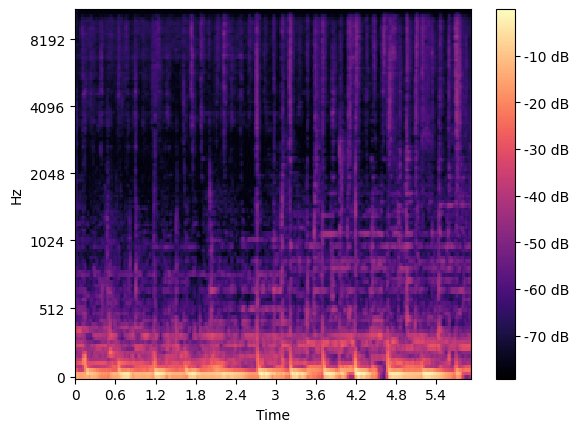

In [ ]:
S = librosa.feature.melspectrogram(
    y=output.audios[0][0], sr=pipe.mel.get_sample_rate(), n_mels=128
)
S_dB = librosa.power_to_db(S, ref=np.max)

librosa.display.specshow(
    S_dB, sr=pipe.mel.get_sample_rate(), x_axis="time", y_axis="mel"
)
plt.colorbar(format="%+2.0f dB");

In [ ]:
from diffusers import StableDiffusionPipeline

pipe = StableDiffusionPipeline.from_pretrained(
    "riffusion/riffusion-model-v1", torch_dtype=torch.float16
)
pipe = pipe.to(device)
prompt = "slow piano piece, classical"
negative_prompt = "drums"
spec_img = pipe(
    prompt, negative_prompt=negative_prompt, height=512, width=512
).images[0]

text_encoder/model.safetensors not found


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
from IPython.display import Audio, display
from scipy.io.wavfile import read, write

from genaibook.core import wav_bytes_from_spectrogram_image

wav = wav_bytes_from_spectrogram_image(spec_img, device)
with open("output1.wav", "wb") as f:
    f.write(wav.getbuffer())

display(Audio("output1.wav"))
read("output1.wav")
sample_rate, audio = read("output1.wav")
audio = audio.astype(np.float16)

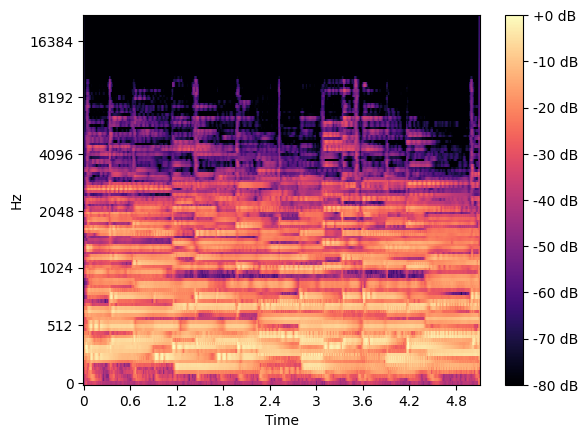

In [ ]:
S = librosa.feature.melspectrogram(y=audio, sr=sample_rate)
S_dB = librosa.power_to_db(S, ref=np.max)

librosa.display.specshow(S_dB, sr=sample_rate, x_axis="time", y_axis="mel")
plt.colorbar(format="%+2.0f dB");

In [ ]:
from diffusers import StableDiffusionImg2ImgPipeline

pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "riffusion/riffusion-model-v1", torch_dtype=torch.float16
)
pipe = pipe.to(device)

prompt = "guitar, acoustic, calmed"
generator = torch.Generator(device=device).manual_seed(1024)
image = pipe(
    prompt=prompt,
    image=spec_img,
    strength=0.7,
    guidance_scale=8,
    generator=generator,
).images[0]

text_encoder/model.safetensors not found


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


  0%|          | 0/35 [00:00<?, ?it/s]

In [ ]:
from IPython.display import Audio, display


wav = wav_bytes_from_spectrogram_image(image)
with open("output1.wav", "wb") as f:
    f.write(wav.getbuffer())

display(Audio("output1.wav"))
read("output1.wav")
sample_rate, audio = read("output1.wav")
audio = audio.astype(np.float16)

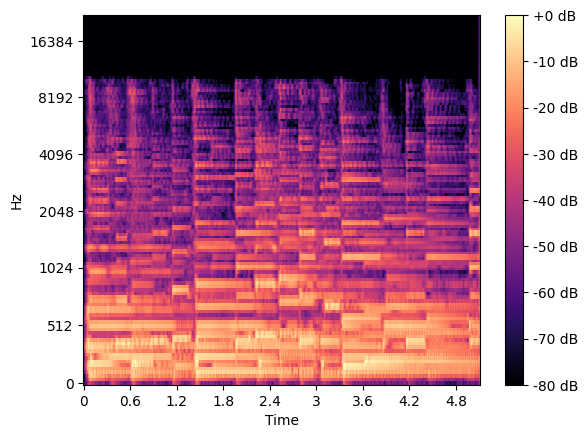

In [ ]:
S = librosa.feature.melspectrogram(y=audio, sr=sample_rate)
S_dB = librosa.power_to_db(S, ref=np.max)

librosa.display.specshow(S_dB, sr=sample_rate, x_axis="time", y_axis="mel")
plt.colorbar(format="%+2.0f dB");

### Dance Diffusion


In [ ]:
from diffusers import DanceDiffusionPipeline

pipe = DanceDiffusionPipeline.from_pretrained(
    "harmonai/maestro-150k", torch_dtype=torch.float16
)
pipe = pipe.to(device)
audio = pipe(audio_length_in_s=5, num_inference_steps=50).audios[0]

unet/diffusion_pytorch_model.safetensors not found


Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
write("maestro_test.wav", pipe.unet.config.sample_rate, audio.transpose())
read("maestro_test.wav")

(16000,
 array([[ 0.00593185, -0.02507019],
        [ 0.00608063, -0.02436829],
        [ 0.00604248, -0.02159119],
        ...,
        [ 0.00696182,  0.00302696],
        [ 0.00670624,  0.0038147 ],
        [ 0.00641632,  0.00354767]], dtype=float32))

In [ ]:
import IPython.display as ipd

display(ipd.Audio(audio, rate=pipe.unet.config.sample_rate))

## Exercises

A big part of learning is putting your knowledge into practice. We strongly suggest not looking at the answers before taking a serious stab at it. Scroll down for the answers.

**1. What are the pros and cons of using waveforms versus spectrograms?**

**Waveforms:**

* Pros
    * Waveforms represent the raw audio signal, preserving all the information needed to reproduce a sound.
    * Waveforms contain all the time-domain information without any transformation or loss.
* Cons
    * Waveforms are difficult to interpret in terms of frequency information.
    * Waveforms can be millions of samples long. This high dimensionality can be challenging for models and may require dimensionality reduction techniques that tend to highly affect the frequency information in the wave. This can impact model performance.
    * Models often struggle to learn useful features directly from the waveforms. 

**Spectrograms:**
* Pros
    * Spectrograms provide a compact and visual representation of the spectrum of frequencies in a signal as they change through time, making it easier to interpret.
    * As they capture both time and frequency information, they can be useful for audio tasks.
* Cons
    * Spectrograms are a transformed, lossy representation of the audio. This can lead to a loss of some details present in the raw waveform.

**2. What's a spectrogram, and what's a mel spectrogram? Which one is used in models?**

Spectrograms plot how the frequency and amplitude of the signal change through time. They are informative tools that visualize time, frequency, and amplitude in a single plot. The x-axis represents time, the y-axis represents frequency, and the color represents the intensity of the frequencies.

A mel spectrogram is a spectrogram where the frequencies are converted to the mel scale, which is designed to approximate the human ear's perception of sound. In the mel spectrogram, equal distances in the frequency axis correspond to equal perceptual differences. 

Although both types of spectrograms are used in models, mel spectrograms are often preferred because they align better with human perception.

**3. Explain how CTC works. Why is it needed for encoder-based ASR models?**

Connectionist Temporal Classification (CTC) is a technique used in ASR models to align input sequences (audio frames) with output sequences (text transcriptions) without requiring explicit alignment. This is crucial because the duration of speech sounds (phonemes) does not align perfectly with fixed-length audio frames. In models like Wav2Vec2, each audio frame might be represented by an embedding corresponding to a short segment of audio (e.g., 25ms). Predicting a character for each 25ms segment would result in a very detailed and impractical sequence. For example, a second of audio might produce 40 characters, leading to an output like:

```
CHAAAAAPTTERRRSSIXTEEEEENIMMMIIGHT...
```

This makes sense, a character might be stretched over multiple audio frames. CTC is used to align the audio frames with the characters. It does this by allowing the model to predict two special characters: a padding token that separates groups of characters, and a separator token that separates words. The model learns to predict such tokens. An example output can look like this:

```
CHAAAAA*PTT*ERRR/SS*IX*T*EE*EEN/I/MMM*II*GHT
``` 

CTC can then easily de-duplicate characters within a group.

**4. What would happen if the inference data had a sampling rate of 8kHz while the model was trained with one of 16kHz?**

Given the frequency mismatch between the model and the data, the model will not be able to process the data correctly. This can lead to poor performance, incorrect transcriptions, or even model failure. You should resample the data to match the model's sampling rate before inference.

**5. How does adding an n-gram model to an encoder-based model work?**

Acoustic models are entirely based on the sound, but have no language information baked in. This can lead to easily outputting mispellings or words that don't exist, or to confuse words with similar ones. A way to mitigate this is to use a language model. N-gram models are a simple type of language model that can be used to correct the output of the encoder-based model. N-gram models are computationally cheap and can significantly boost the performance of encoder-based ASR models such as Wav2Vec2. 

The n-gram model's score is incorporated during the generation stage. For example, the model probabilities and the n-gram model probabilities can be combined doing a weighted sum. The n-gram model can help correct errors made by the encoder-based model.

**6. What are the pros and cons of encoder-based versis encoder-decoder-based models for ASR?**

**Encoder-based models:**

Pros:
* **Computationally Efficient:** These models are generally more computationally efficient because they do not rely on an auto-regressive process, making them faster in both training and inference.
* **Simple Architecture:** The architecture of encoder-based models is simpler to implement and train compared to encoder-decoder models.
* **Direct Mapping:** They provide a straightforward one-to-one correspondence between input and output sequences, which simplifies the alignment process. A CTC process is still needed, but there won't be additional unexpected tokens.

Cons:
* **Context Limitations:** Encoder-based models often struggle with long-range dependencies and maintaining context over longer sequences, which can affect their performance on more complex ASR tasks.


**Encoder-decoder-based models**

Pros:
* **Integrated Language Modeling:** The decoder inherently models language, eliminating the need for an external n-gram language model, which can simplify the overall system.
* **Quality of Output:** These models generally produce higher quality outputs, especially for complex ASR tasks, as they can better handle long-range dependencies and context.

Cons:
* **Risk of Hallucination:** Encoder-decoder models can sometimes generate tokens even when there is no corresponding input, leading to "hallucinations".
* **Slower Inference:** Generation is slower because the model outputs tokens one at a time in an auto-regressive manner, which can be a bottleneck in real-time applications.

**7. In which case would you prefer to use CER over WER to evaluate ASR?**

WER is used more frequently for ASR systems as it pushes for systems with greater understanding. Some languages such as Japanese have no notion of words. In those cases, we revert to CER. CER can also be used if the task requires measuring accuracy at a finer level of granularity to understand errors better.

**8. Which are the six different nets used by SpeechT5? Which setup would be needed to perform voice conversion?**

There are text and speech encoder pre-nets (2), decoder pre-nets (2), and decoder post-nets(2). For voice conversion, you would use speech encoder pre-net, speech decoder pre-net, and speech decoder post-net.

**9. What's a vocoder? In which cases would you use one?**

In the context of Audio ML, vocoders are used to convert representations such as mel-spectrograms back into audio waveforms. They are used in text-to-audio systems that output spectrogams due to spectrograms not containing all the information needed (e.g. phase informaton).

**10. What's the purpose of the EnCodec model?**

EnCodec is a neural codec that can compress audio in real-time. It compresses audio into codebooks (vectors in a quantized latent space). The ENCodec model has high compression ratios while maintaining good audio quality.

**11. How do TTA models leverage Mulan/CLAP to relax the need for labeled data?**

These models can map texts and audios into the same embedding space (just as CLIP). While training a model, CLAP can generate embeddings of the audio samples and then we can condition the model on these embeddings. During inference, we can use the text embeddings instead.

### Challenges

**12. Whisper exploration. The following code snippet creates a random array and a Whisper feature extractor from scratch. Explore the impact of changing `feature_size`, `hop_length`, and `chunk_length` in the shape of the input features. Then, look at the default values of the Whisper `FeatureExtractor` in [its documentation](https://huggingface.co/docs/transformers/en/model_doc/whisper) and what each of them means, and try calculating how many features would be generated for an audio chunk.**

In [12]:
import numpy as np
from transformers import WhisperFeatureExtractor

array = np.zeros((16000, ))
feature_extractor = WhisperFeatureExtractor(feature_size=100)
features = feature_extractor(
    array, sampling_rate=16000, return_tensors="pt"
)
features["input_features"].shape

torch.Size([1, 100, 3000])

* 1: The batch size
* 100: The number of feature vectors extracted from each chunk of audio.
* 3000: The dimensionality of each feature vector. It indicates the number of features at each time interval.

Let's think about these numbers. The sampling rate is 16000 Hz and the default `chunk_length` is 30 (the default value). This parameter specifies the maximum number of chunks of samples used to process the audio. In this case, the audio is divided into chunks of 30 units. To calculate the number of feature vectors extracted per chunk of audio, we need to consider the overlap between consecutive chunks. The overlap is determined by the `hop_length` parameter. `hop_length` defines the number of samples between each feature exraction. A smaller `hop_length` means we do more frequent feature extractions. This can capture more detailed information but will also increase the number of features and the computational cost.

Total samples in one chunk = `chunk_length` * `sampling_rate` = 30 * 16000 = 480000 samples

Number of feature vectors per chunk = `Total samples in one chunk` / `hop_length` = 480000 / 160 = 3000

This means, we have one audio sample in the batch, with 3000 time steps and 100 features at each time step.

Increasing `feature_size` increases the dimension of the feature vector extracted for each time step. This can potentially capture more information but will require more compute power. (big surprise)

In [ ]:
feature_extractor = WhisperFeatureExtractor(feature_size=200)
features = feature_extractor(
    array, sampling_rate=16000, return_tensors="pt"
)
features["input_features"].shape

torch.Size([1, 200, 3000])

Reducing `hop_length` by half doubles the number of features we pass to the model. The `hop_length` is the length of overlapping windows in the spectrogram. By reducing it, we increase the number of windows and, therefore, the number of features.

In [16]:
feature_extractor = WhisperFeatureExtractor(feature_size=100, hop_length=80)
features = feature_extractor(
    array, sampling_rate=16000, return_tensors="pt"
)
features["input_features"].shape

torch.Size([1, 100, 6000])

Similarly, increasing `chunk_length` by a factor of 2 doubles the number of features we pass to the model. The `chunk_length` is the length of the audio chunks we process. By doubling it, we double the number of features extracted from each chunk.

In [17]:
feature_extractor = WhisperFeatureExtractor(feature_size=100, chunk_length=60)
features = feature_extractor(
    array, sampling_rate=16000, return_tensors="pt"
)
features["input_features"].shape

torch.Size([1, 100, 6000])

**13. Voice conversion. Implement voice conversion with SpeechT5 so that an input audio is spoken by a different speaker.**

The code will look very similar to the one in the book for TTS, with the key differences being

* We use a different pretrained model: `microsoft/speecht5_vc`.
* We use the model class `SpeechT5ForSpeechToSpeech`.
* The input is now an audio rather than a text file.

In [ ]:
# Sample we'll transfer
from datasets import load_dataset

ds = load_dataset(
    "librispeech_asr",
    split="train.clean.100",
    streaming=True,
    trust_remote_code=True,
)
sample = next(iter(ds))     
array = sample["audio"]["array"]

In [53]:
from transformers import SpeechT5ForSpeechToSpeech
import torch 

processor = SpeechT5Processor.from_pretrained("microsoft/speecht5_vc")
# Key difference 1: We use a different model class
model = SpeechT5ForSpeechToSpeech.from_pretrained("microsoft/speecht5_vc")

# Key difference 2: We pass the audio array as input
inputs = processor(
    audio=array, sampling_rate=16000, return_tensors="pt"
)

embeddings_dataset = load_dataset(
    "Matthijs/cmu-arctic-xvectors", split="validation"
)
speaker_embeddings = torch.tensor(
    embeddings_dataset[7440]["xvector"]
).unsqueeze(0)

with torch.no_grad():
    # Key difference 3: Rather than input_ids, we use input_values
    spectrogram = model.generate_speech(inputs["input_values"], speaker_embeddings)

Some weights of the model checkpoint at microsoft/speecht5_vc were not used when initializing SpeechT5ForSpeechToSpeech: ['speecht5.encoder.prenet.pos_conv_embed.conv.weight_g', 'speecht5.encoder.prenet.pos_conv_embed.conv.weight_v']
- This IS expected if you are initializing SpeechT5ForSpeechToSpeech from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing SpeechT5ForSpeechToSpeech from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of SpeechT5ForSpeechToSpeech were not initialized from the model checkpoint at microsoft/speecht5_vc and are newly initialized: ['speecht5.encoder.prenet.pos_conv_embed.conv.parametrizations.weight.original0', 'speecht5.encoder.prenet.pos_conv_embed.conv.parametrizati

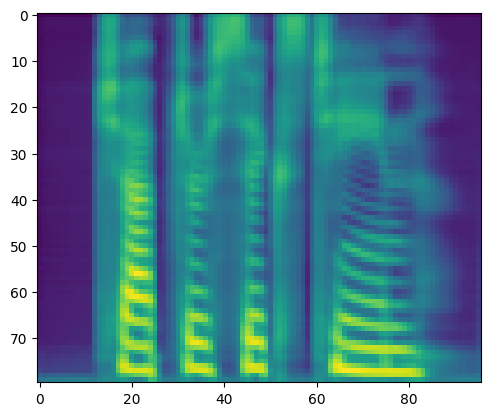

In [54]:
import numpy as np
from matplotlib import pyplot as plt

plt.figure()
plt.imshow(np.rot90(np.array(spectrogram)))
plt.show()

Let's again use the vocoder

In [ ]:
from transformers import SpeechT5HifiGan

vocoder = SpeechT5HifiGan.from_pretrained("microsoft/speecht5_hifigan")
with torch.no_grad():
    speech = vocoder(spectrogram)

In [56]:
len(speech)

24576

In [57]:
import IPython.display as ipd

display(ipd.Audio(speech.numpy(), rate=16000))

Seems like it worked! But for some reason the output is being cut - it just converts the first two words. It turns out the vocoder has a parameter, `threshold`, which is determined to predict when it's the end of the audio and stops. We suggest looking into the [SpeechT5](https://huggingface.co/docs/transformers/en/model_doc/speecht5) documentation.